In [71]:
# %pip install astroquery pandas
# %pip install scipy
# %pip install seaborn
# %pip install plotly nbformat
%pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [72]:
import pandas as pd
import numpy as np
import os
import time
from astroquery.gaia import Gaia

In [73]:
TRIAL = 2

RA_CENTER = 307.557
DEC_CENTER = 40.256

# 관측 반경 구간 (도넛 모양: 0~1도, 1~2도, 2~3도)
RADII_INTERVALS = [(0.0, 1.0), (1.0, 2.0), (2.0, 3.0)]

# 저장할 디렉토리 경로 생성 (예: ./data_1)
DATA_DIR = f"./data_{TRIAL}"

# ★ 디렉토리 자동 생성 (핵심!) ★
# exist_ok=True: 폴더가 이미 있어도 에러 내지 말고 넘어가라는 뜻
os.makedirs(DATA_DIR, exist_ok=True)
print(f"📂 데이터 저장 경로 확인: {DATA_DIR}")

# 파일명 설정 (경로 포함)
FINAL_FILENAME = os.path.join(DATA_DIR, f"cygnus_data_full_{TRIAL}.csv")

📂 데이터 저장 경로 확인: ./data_2


In [74]:
def query_gaia_annulus(r_min, r_max):
    print(f"   >> Gaia 서버 요청 중... (구간: {r_min}° ~ {r_max}°)")
    
    query = f"""
    SELECT 
        g.source_id, g.ra, g.dec, 
        g.parallax, g.parallax_error, g.ruwe,
        g.phot_g_mean_mag, g.bp_rp, 
        g.phot_bp_mean_mag, g.phot_rp_mean_mag,
        t.j_m, t.h_m, t.ks_m, t.ph_qual
    FROM gaiadr3.gaia_source AS g
    JOIN gaiadr3.tmass_psc_xsc_best_neighbour AS x 
        ON g.source_id = x.source_id
    JOIN gaiadr1.tmass_original_valid AS t 
        ON x.original_ext_source_id = t.designation
    WHERE 
        1=CONTAINS(POINT('ICRS', g.ra, g.dec), CIRCLE('ICRS', {RA_CENTER}, {DEC_CENTER}, {r_max}))
        AND DISTANCE(POINT('ICRS', g.ra, g.dec), POINT('ICRS', {RA_CENTER}, {DEC_CENTER})) >= {r_min}
        AND g.parallax > 0
        AND g.phot_g_mean_mag < 18
    """
    
    job = Gaia.launch_job_async(query)
    return job.get_results().to_pandas()

In [75]:
df = None

try:
    # 1. 일단 통합 파일 로드 시도
    print(f"📂 통합 파일({FINAL_FILENAME}) 로드를 시도합니다...")
    df = pd.read_csv(FINAL_FILENAME)
    print(f"✅ 성공! 통합 데이터를 로드했습니다. (총 {len(df)}개)")

except FileNotFoundError:
    print("⚠️ 통합 파일이 없습니다. 구간별 다운로드를 시작합니다.")
    
    part_dfs = []
    
    for r_min, r_max in RADII_INTERVALS:
        # 부분 파일명도 폴더 안에 들어가도록 설정
        part_filename = os.path.join(DATA_DIR, f"cygnus_part_{r_min}_{r_max}_{TRIAL}.csv")
        
        try:
            # 2. 구간별 파일 로드 시도
            print(f"  🔍 부분 파일 확인: {part_filename}")
            part_df = pd.read_csv(part_filename)
            
        except FileNotFoundError:
            # 3. 없으면 다운로드
            print(f"  ❌ 파일 없음. Gaia 다운로드 시작 ({r_min}°~{r_max}°)...")
            try:
                part_df = query_gaia_annulus(r_min, r_max)
                part_df.to_csv(part_filename, index=False)
                print(f"  💾 저장 완료: {part_filename}")
                time.sleep(1)
            except Exception as e:
                print(f"  💥 다운로드 실패 ({r_min}~{r_max}): {e}")
                continue
        
        part_dfs.append(part_df)
    
    # 4. 병합 및 저장
    if part_dfs:
        print("\n🔄 데이터 병합 중...")
        df = pd.concat(part_dfs, ignore_index=True)
        
        # 중복 제거
        before = len(df)
        df.drop_duplicates(subset=['source_id'], inplace=True)
        
        # 최종 파일 저장
        df.to_csv(FINAL_FILENAME, index=False)
        print(f"✅ 모든 작업 완료! 파일 저장됨: {FINAL_FILENAME}")
        print(f"   (중복 {before - len(df)}개 제거됨)")

if df is not None:
    display(df.head())

📂 통합 파일(./data_2/cygnus_data_full_2.csv) 로드를 시도합니다...
✅ 성공! 통합 데이터를 로드했습니다. (총 212473개)


,source_id,ra,dec,parallax,parallax_error,ruwe,phot_g_mean_mag,bp_rp,phot_bp_mean_mag,phot_rp_mean_mag,j_m,h_m,ks_m,ph_qual
0,2064624249869695104,308.591095,39.651709,0.738892,0.021991,1.175306,14.817863,1.416784,15.453303,14.036519,13.044,12.671,12.506,AAA
1,2064624490387864064,308.547039,39.616959,0.838164,0.021633,1.011702,15.197369,1.574762,15.932045,14.357283,13.239,12.851,12.662,AAA
2,2064624559107341568,308.543977,39.629035,0.744205,0.039393,1.112728,16.207708,2.312640,17.420042,15.107402,13.322,12.832,12.506,UAA
3,2064624589171410048,308.553673,39.634993,0.804884,0.046684,1.025558,16.694183,1.869307,17.620134,15.750828,14.432,13.955,13.870,AAA
4,2064624627826817920,308.568359,39.646608,3.347141,0.048189,0.981480,16.755404,2.564953,18.164257,15.599304,14.049,13.425,13.146,AAA


In [76]:
import numpy as np

# 1. 거리 계산 (Distance)
# 공식: d(pc) = 1000 / parallax(mas)
df['distance'] = 1000 / df['parallax']

# 2. 절대등급 계산 (Absolute Magnitude)
# 공식: M = m - 5 * log10(d) + 5
df['abs_G'] = df['phot_g_mean_mag'] - 5 * np.log10(df['distance']) + 5

# 3. 적외선 색지수 (2MASS IR Color)
df['J_H'] = df['j_m'] - df['h_m']
df['H_K'] = df['h_m'] - df['ks_m']

# 4. 데이터 필터링 (Quality Control)
# - RUWE < 1.4: 좋은 단일성 데이터
# - Distance < 3000: 연구 범위(Cygnus X가 약 1.5kpc이므로 3kpc면 충분)
# - Absolute Mag Check: 너무 밝거나 어두운 이상치 제거
filter_mask = (
    (df['ruwe'] < 1.4) & 
    (df['distance'] > 0) & 
    (df['distance'] < 3000) &
    (df['bp_rp'].notna()) &
    (df['J_H'].notna()) &
    (df['H_K'].notna())
)

clean_df = df[filter_mask].copy()

print(f"전처리 완료: {len(df)}개 -> {len(clean_df)}개 (유효 데이터)")

전처리 완료: 212473개 -> 158480개 (유효 데이터)


In [77]:
from scipy.optimize import curve_fit

# 1. 가까운 별 추출 (Reference Stars)
# 100pc 이내는 성간 소광이 거의 없다고 가정 (Local Bubble)
nearby_stars = clean_df[clean_df['distance'] < 100]

# 2. 주계열성 피팅 함수 정의 (3차 다항식)
# 관측된 절대등급(M)에 따른 고유 색지수(BP-RP)_0를 추정
def zams_poly(mag, a, b, c, d):
    return a * mag**3 + b * mag**2 + c * mag + d

# 3. 피팅 수행 (X축: 절대등급, Y축: 색지수)
# 주의: 거성을 제외하고 주계열성만 잡기 위해 M_G > 2.0 조건 추가 권장
ms_stars = nearby_stars[nearby_stars['abs_G'] > 2.0]
popt, pcov = curve_fit(zams_poly, ms_stars['abs_G'], ms_stars['bp_rp'])

# 4. 전체 별에 대해 소광량(Extinction) 계산
# (BP-RP)_0 = 고유 색지수 (ZAMS 모델값)
clean_df['bp_rp_0'] = zams_poly(clean_df['abs_G'], *popt)

# E(BP-RP) = (BP-RP)_obs - (BP-RP)_0
clean_df['E_bp_rp'] = clean_df['bp_rp'] - clean_df['bp_rp_0']

# 음수 값 보정 (측정 오차로 인해 -가 된 것은 0으로 처리)
clean_df['E_bp_rp'] = clean_df['E_bp_rp'].clip(lower=0)

print("소광량(Reddening) 계산 완료.")

소광량(Reddening) 계산 완료.


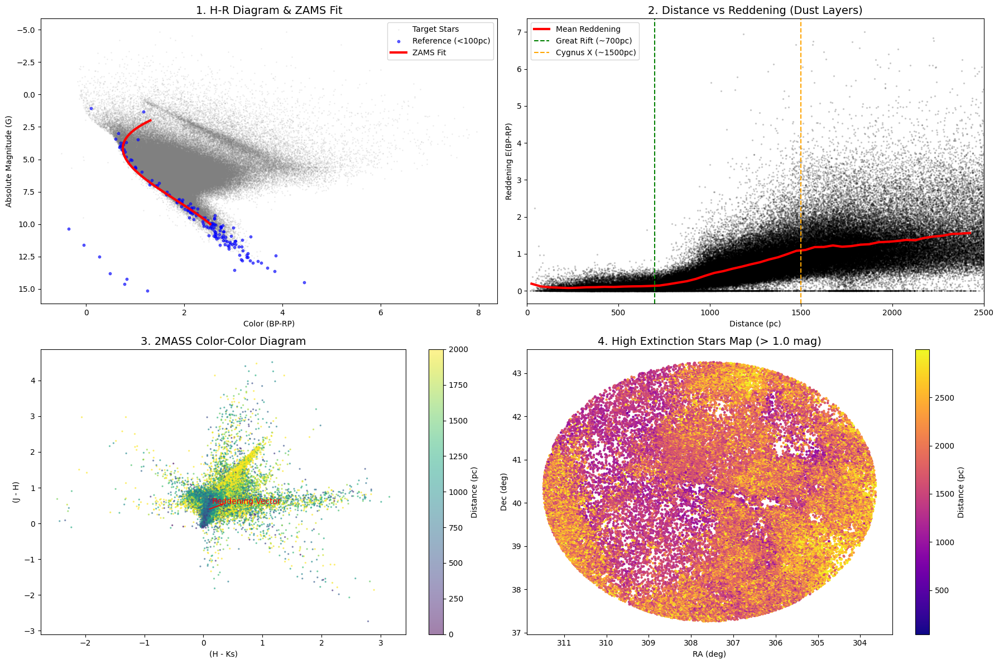

In [78]:
import matplotlib.pyplot as plt
import seaborn as sns

# 그래프 스타일 설정
plt.style.use('default') 
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# ---------------------------------------------------------
# [Chart 1] H-R Diagram (ZAMS Fitting 확인)
# ---------------------------------------------------------
ax1 = axes[0, 0]
# 배경: 전체 별
ax1.scatter(clean_df['bp_rp'], clean_df['abs_G'], s=1, color='gray', alpha=0.1, label='Target Stars')
# 전경: 기준 별 (Nearby)
ax1.scatter(nearby_stars['bp_rp'], nearby_stars['abs_G'], s=10, color='blue', alpha=0.6, label='Reference (<100pc)')

# 피팅 라인 그리기
y_fit = np.linspace(2, 10, 100)
x_fit = zams_poly(y_fit, *popt)
ax1.plot(x_fit, y_fit, color='red', linewidth=3, label='ZAMS Fit')

ax1.invert_yaxis() # 등급은 작을수록 밝음
ax1.set_title("1. H-R Diagram & ZAMS Fit", fontsize=14)
ax1.set_xlabel("Color (BP-RP)")
ax1.set_ylabel("Absolute Magnitude (G)")
ax1.legend()


# ---------------------------------------------------------
# [Chart 2] 거리 vs 소광 (핵심 결과!)
# ---------------------------------------------------------
ax2 = axes[0, 1]
# 스캐터 플롯 (점이 너무 많으면 보기 힘들어서 투명도 조절)
ax2.scatter(clean_df['distance'], clean_df['E_bp_rp'], s=2, color='black', alpha=0.15)

# 이동 평균선 (Trend Line) - 먼지 층을 시각적으로 강조
# 50pc 단위로 구간 평균을 내서 연결
bins = np.arange(0, 2500, 50)
bin_centers = 0.5 * (bins[:-1] + bins[1:])
digitized = np.digitize(clean_df['distance'], bins)
mean_ext = [clean_df['E_bp_rp'][digitized == i].mean() for i in range(1, len(bins))]

ax2.plot(bin_centers, mean_ext, color='red', linewidth=3, label='Mean Reddening')

# 예상되는 먼지 벽 위치 표시 (수직선)
ax2.axvline(x=700, color='green', linestyle='--', label='Great Rift (~700pc)')
ax2.axvline(x=1500, color='orange', linestyle='--', label='Cygnus X (~1500pc)')

ax2.set_title("2. Distance vs Reddening (Dust Layers)", fontsize=14)
ax2.set_xlabel("Distance (pc)")
ax2.set_ylabel("Reddening E(BP-RP)")
ax2.set_xlim(0, 2500)
ax2.legend()


# ---------------------------------------------------------
# [Chart 3] IR Color-Color Diagram (2MASS)
# ---------------------------------------------------------
ax3 = axes[1, 0]
# 거리에 따라 색상을 다르게 표현 (가까움: 파랑 -> 멂: 노랑)
sc = ax3.scatter(clean_df['H_K'], clean_df['J_H'], c=clean_df['distance'], 
                 s=2, cmap='viridis', alpha=0.5, vmin=0, vmax=2000)

ax3.set_title("3. 2MASS Color-Color Diagram", fontsize=14)
ax3.set_xlabel("(H - Ks)")
ax3.set_ylabel("(J - H)")
plt.colorbar(sc, ax=ax3, label='Distance (pc)')

# 적색화 벡터 방향 (이론적 예시 화살표)
ax3.arrow(0.1, 0.4, 0.2, 0.12, head_width=0.03, color='red')
ax3.text(0.15, 0.55, "Reddening Vector", color='red')


# ---------------------------------------------------------
# [Chart 4] 소광 맵 (하늘에서의 분포)
# ---------------------------------------------------------
ax4 = axes[1, 1]
# 소광량이 높은 별들만 골라서 위치를 찍어봄
high_ext_stars = clean_df[clean_df['E_bp_rp'] > 1.0] # 소광이 심한 별
sc2 = ax4.scatter(high_ext_stars['ra'], high_ext_stars['dec'], 
                  c=high_ext_stars['distance'], s=5, cmap='plasma')

ax4.set_title("4. High Extinction Stars Map (> 1.0 mag)", fontsize=14)
ax4.set_xlabel("RA (deg)")
ax4.set_ylabel("Dec (deg)")
ax4.invert_xaxis() # 천문학 관례 (RA는 반대로)
plt.colorbar(sc2, ax=ax4, label='Distance (pc)')

plt.tight_layout()
plt.show()

In [79]:
import numpy as np
import plotly.express as px

# -------------------------------------------------------
# [Step 1] 좌표 변환 (이 부분이 빠져서 에러가 난 것입니다!)
# -------------------------------------------------------
# 1. 각도를 라디안으로 변환
ra_rad = np.radians(clean_df['ra'])
dec_rad = np.radians(clean_df['dec'])
dist = clean_df['distance']

# 2. 구면 좌표계 -> 직교 좌표계(X, Y, Z) 공식 적용
clean_df['X_pc'] = dist * np.cos(dec_rad) * np.cos(ra_rad)
clean_df['Y_pc'] = dist * np.cos(dec_rad) * np.sin(ra_rad)
clean_df['Z_pc'] = dist * np.sin(dec_rad)

print("좌표 변환 완료! 이제 X_pc, Y_pc, Z_pc 컬럼이 생성되었습니다.")

좌표 변환 완료! 이제 X_pc, Y_pc, Z_pc 컬럼이 생성되었습니다.


In [80]:
import plotly.express as px

# 1. 컬러맵 변경: 'plasma_r' -> 'plasma' 
# (이제 보라색이 0(깨끗), 노란색이 먼지 많음이 됩니다)
fig = px.scatter_3d(
    clean_df,
    x='X_pc', y='Y_pc', z='Z_pc',
    color='E_bp_rp',
    color_continuous_scale='plasma',  # _r을 뺐습니다! (직관적인 색상)
    range_color=[0, 2.0],             # 색상 범위를 2.0까지만 (너무 큰 값에 묻히지 않게)
    opacity=1.0,                      # 투명도 조절
    hover_data=['distance', 'source_id'],
    title="3D Map: True Scale (Purple=Clean, Yellow=Dusty)"
)

# 2. 마커 크기 및 비율 보정 (가장 중요!)
fig.update_traces(marker=dict(size=0.1)) # 점 크기를 줄여서 정밀하게

fig.update_layout(
    scene=dict(
        xaxis_title='X (pc)',
        yaxis_title='Y (pc)',
        zaxis_title='Z (pc)',
        bgcolor='rgb(20, 20, 20)',
        
        # ★ 핵심 수정: 실제 비율대로 그리기 ★
        # 이걸 넣으면 뚱뚱한 소시지가 아니라 "얇은 레이저 빔"처럼 보일 겁니다.
        aspectmode='data' 
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

fig.show()

/var/folders/5c/8wp3844j3sq61p1pzdnyljf80000gn/T/ipykernel_39576/29216096.py:18: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



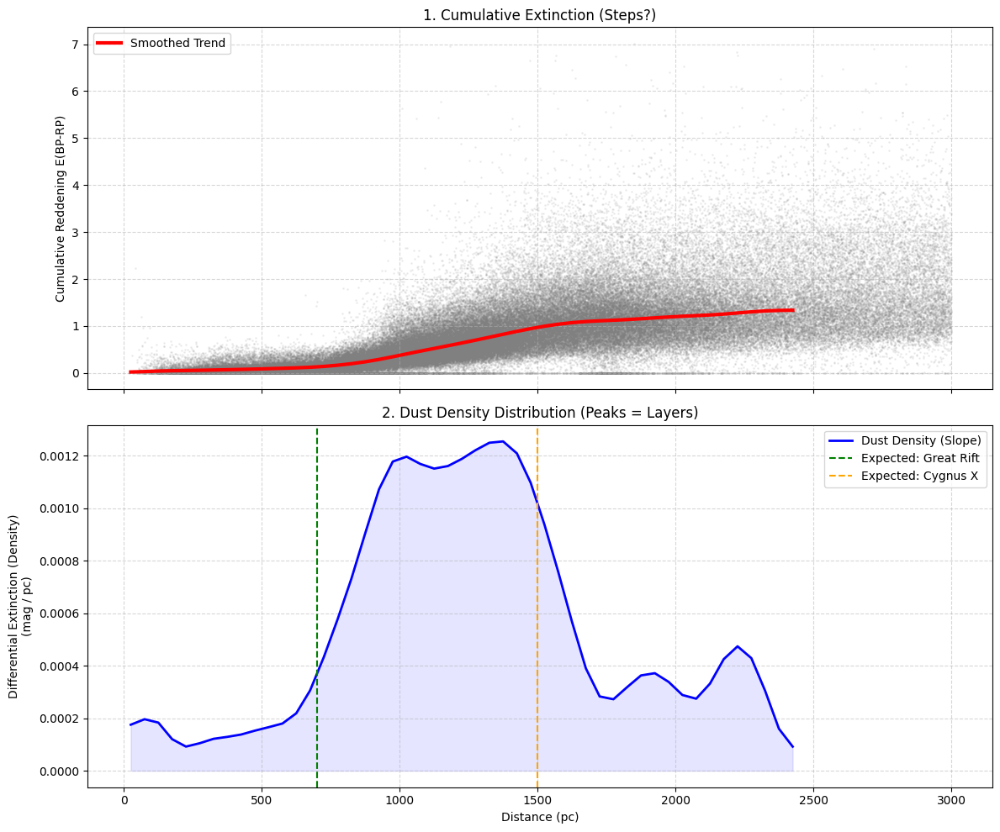

In [81]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.ndimage import gaussian_filter1d

# ========================================================
# 1. 거리별 평균 소광량 계산 (Binning)
# ========================================================
# 50pc 단위로 구간을 나눕니다 (너무 작으면 노이즈가 심해짐)
bin_size = 50 
bins = np.arange(0, 2500, bin_size)
labels = (bins[:-1] + bins[1:]) / 2

# 각 구간(Bin)에 속하는 별들의 '중간값(Median)'을 구합니다.
# (평균보다는 중간값이 이상치(Outlier)에 덜 민감해서 더 깔끔합니다)
df_bin = clean_df.copy()
df_bin['dist_bin'] = pd.cut(clean_df['distance'], bins=bins, labels=labels)
grouped = df_bin.groupby('dist_bin')['E_bp_rp'].median()

# 데이터가 없는 구간 보간 (Interpolation)
grouped = grouped.interpolate()

# ========================================================
# 2. 미분 수행 (기울기 = 먼지 밀도 구하기)
# ========================================================
x_vals = grouped.index.astype(float).values
y_vals = grouped.values

# 노이즈를 줄이기 위해 살짝 부드럽게 만듦 (Gaussian Smoothing)
y_smooth = gaussian_filter1d(y_vals, sigma=1.5)

# 기울기 계산 (dE / dd)
# 단위: mag / pc (1pc 갈 때 소광이 얼마나 심해지는가)
slope = np.gradient(y_smooth, x_vals)

# ========================================================
# 3. 시각화 (층 분류 그래프)
# ========================================================
fig, ax = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

# [위] 누적 소광량 (원래 보던 것)
ax[0].scatter(clean_df['distance'], clean_df['E_bp_rp'], s=1, c='gray', alpha=0.1)
ax[0].plot(x_vals, y_smooth, color='red', linewidth=3, label='Smoothed Trend')
ax[0].set_ylabel('Cumulative Reddening E(BP-RP)')
ax[0].set_title('1. Cumulative Extinction (Steps?)')
ax[0].legend()
ax[0].grid(True, linestyle='--', alpha=0.5)

# [아래] 소광 변화율 (먼지 밀도) - 여기가 핵심!
ax[1].plot(x_vals, slope, color='blue', linewidth=2, label='Dust Density (Slope)')
ax[1].fill_between(x_vals, 0, slope, color='blue', alpha=0.1) # 면적 칠하기

# 피크(먼지 벽) 예상 지점 표시
ax[1].axvline(x=700, color='green', linestyle='--', label='Expected: Great Rift')
ax[1].axvline(x=1500, color='orange', linestyle='--', label='Expected: Cygnus X')

ax[1].set_ylabel('Differential Extinction (Density)\n(mag / pc)')
ax[1].set_xlabel('Distance (pc)')
ax[1].set_title('2. Dust Density Distribution (Peaks = Layers)')
ax[1].legend()
ax[1].grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

📡 다파장 분석 결과:
   적색화 벡터 기울기 (Slope): 3.972
   (의미: 적외선 색초과 E(H-Ks)가 1 증가할 때, E(G-Ks)는 3.972만큼 증가함)

🔄 소광 보정 반복 계산 시작 (ZAMS Fitting)...
   Iteration 1: 평균 A_G = 1.7831 mag
   Iteration 2: 평균 A_G = 1.9327 mag
   Iteration 3: 평균 A_G = 2.2767 mag
   Iteration 4: 평균 A_G = 2.0274 mag
   Iteration 5: 평균 A_G = 2.3269 mag
✅ 최종 완료! 유효 데이터: 76700개
거성/이상치 제거 완료: 76700 -> 74307개


/var/folders/5c/8wp3844j3sq61p1pzdnyljf80000gn/T/ipykernel_39576/2695421278.py:155: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/5c/8wp3844j3sq61p1pzdnyljf80000gn/T/ipykernel_39576/2695421278.py:165: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



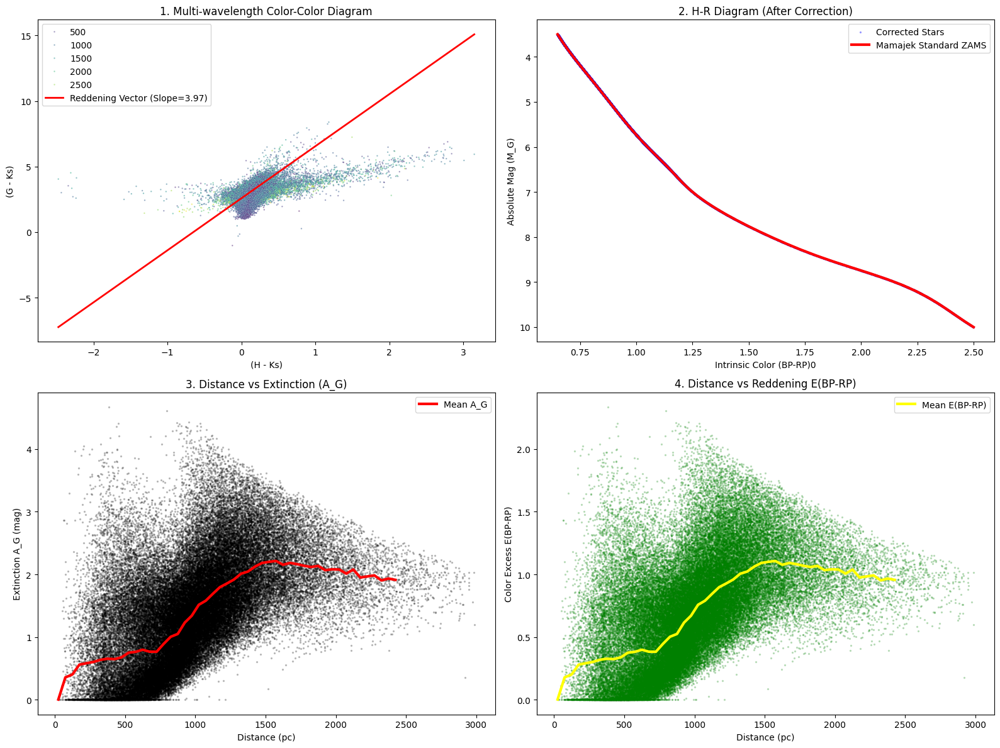

In [82]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.interpolate import interp1d
from scipy.stats import linregress

# ==============================================================================
# 1. Eric Mamajek's A Modern Mean Dwarf Stellar Color & Effective Temperature Sequence
# (Simplified for Main Sequence: 3.5 < M_G < 10)
# ==============================================================================
# 출처: https://www.pas.rochester.edu/~emamajek/EEM_dwarf_UBVIJHK_colors_Teff.txt
# 절대등급(M_G)에 따른 고유 색지수(BP-RP)_0 데이터
mamajek_data = {
    'M_G':     [3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0, 9.5, 10.0],
    'BP_RP_0': [0.65, 0.72, 0.80, 0.88, 0.96, 1.05, 1.15, 1.25, 1.40, 1.60, 1.85, 2.15, 2.35, 2.50]
}

# 보간 함수 생성 (Absolute Mag를 넣으면 -> Intrinsic Color를 뱉어줌)
# fill_value="extrapolate": 범위 살짝 벗어나도 추세 따라가게 설정
get_intrinsic_color = interp1d(mamajek_data['M_G'], mamajek_data['BP_RP_0'], 
                               kind='cubic', fill_value="extrapolate")

# ==============================================================================
# 2. 데이터 준비 및 1차 필터링
# ==============================================================================
# CSV 파일 로드 (만약 df가 이미 있다면 생략 가능)
# df = pd.read_csv('cygnus_data_full_1.csv') # 파일명 상황에 맞게 수정

# 기본 변수 계산
df['distance'] = 1000 / df['parallax']
df['G_Ks'] = df['phot_g_mean_mag'] - df['ks_m']   # Y축용 (가시광-적외선)
df['H_Ks'] = df['h_m'] - df['ks_m']               # X축용 (적외선)

# 1차 필터링 (품질 및 주계열성 후보군)
# - RUWE < 1.4 (Gaia 신뢰도)
# - Parallax > 0 (거리 존재)
# - 절대등급 가계산(소광 무시) 했을 때 너무 벗어난 것 제외 (대략적 필터링)
df['M_G_approx'] = df['phot_g_mean_mag'] - 5*np.log10(df['distance']) + 5
mask_quality = (
    (df['ruwe'] < 1.4) & 
    (df['distance'] > 0) & 
    (df['distance'] < 3000) &
    (df['M_G_approx'] > 2.0) & (df['M_G_approx'] < 12.0) & # 좀 더 넉넉하게 잡고 나중에 쳐냄
    df['bp_rp'].notna() & df['H_Ks'].notna() & df['G_Ks'].notna()
)
clean_df = df[mask_quality].copy()

# ==============================================================================
# 3. 다파장 분석: 적색화 벡터(Reddening Vector) 기울기 측정
# ==============================================================================
# 목표: Color-Color Diagram에서 별들이 늘어진 기울기(Slope)를 구함
# X축: (H - Ks), Y축: (G - Ks)

# 로컬 버블(가까운 별)과 먼 별 구분
nearby = clean_df[clean_df['distance'] < 100]
distant = clean_df[clean_df['distance'] > 1000]

# 선형 회귀 (먼 별들의 분포가 곧 적색화 벡터의 방향)
slope, intercept, r_value, p_value, std_err = linregress(distant['H_Ks'], distant['G_Ks'])

print(f"📡 다파장 분석 결과:")
print(f"   적색화 벡터 기울기 (Slope): {slope:.3f}")
print(f"   (의미: 적외선 색초과 E(H-Ks)가 1 증가할 때, E(G-Ks)는 {slope:.3f}만큼 증가함)")

# ==============================================================================
# 4. Iteration Loop (핵심 로직)
# ==============================================================================
print("\n🔄 소광 보정 반복 계산 시작 (ZAMS Fitting)...")

# 설정값
R_factor = 2.0  # A_G = R * E(BP-RP). 일반적인 값 (R_V에 따라 달라짐, 여기선 상수로 가정)
MAX_ITER = 5    # 5번 정도면 충분히 수렴함

# 초기화: 소광량 A_G = 0으로 시작
clean_df['A_G'] = 0.0

for i in range(MAX_ITER):
    # 1. 절대등급 재계산 (소광 보정 적용)
    # M = m - 5log(d) + 5 - A_G
    clean_df['M_G_calc'] = clean_df['phot_g_mean_mag'] - 5*np.log10(clean_df['distance']) + 5 - clean_df['A_G']
    
    # 2. 필터링: 주계열성 범위(3.5 ~ 10.0) 내의 별만 사용하여 계산 (이상치 방지)
    # (주의: 반복문 안에서 필터링하면 데이터 개수가 변하므로, 값만 업데이트하고 나중에 자름)
    
    # 3. Mamajek 테이블에서 '원래 색(BP-RP)_0' 가져오기
    clean_df['bprp_0'] = get_intrinsic_color(clean_df['M_G_calc'])
    
    # 4. 색초과(Color Excess) 계산
    # E(BP-RP) = (BP-RP)_obs - (BP-RP)_0
    clean_df['E_bprp'] = clean_df['bp_rp'] - clean_df['bprp_0']
    
    # 음수 소광(오차) 0으로 보정
    clean_df['E_bprp'] = clean_df['E_bprp'].clip(lower=0)
    
    # 5. 소광량(A_G) 업데이트
    # A_G(new) = R * E(BP-RP)
    clean_df['A_G'] = R_factor * clean_df['E_bprp']
    
    print(f"   Iteration {i+1}: 평균 A_G = {clean_df['A_G'].mean():.4f} mag")

# 최종 필터링 (수렴 후, 진짜 주계열성 범위만 남기기)
final_mask = (clean_df['M_G_calc'] >= 3.5) & (clean_df['M_G_calc'] <= 10.0)
final_df = clean_df[final_mask].copy()
print(f"✅ 최종 완료! 유효 데이터: {len(final_df)}개")

# ------------------------------------------------------------
# [추가] 거성(Giant)으로 추정되는 이상치 제거
# ------------------------------------------------------------
# 설명: 주계열성 모델에 맞지 않아 소광량이 비정상적으로 높게(E > 2.5) 나온 별들을 제거합니다.
# 백조자리 방향에서 3kpc 이내라면 E(BP-RP)가 2.5를 넘기 힘듭니다.

real_signal_df = final_df[final_df['E_bprp'] < 2.5].copy()

print(f"거성/이상치 제거 완료: {len(final_df)} -> {len(real_signal_df)}개")

# 이제 final_df 대신 real_signal_df를 사용하여 그래프를 그립니다.
final_df = real_signal_df

# ==============================================================================
# 5. 결과 시각화
# ==============================================================================
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# [1] Color-Color Diagram & Slope
ax1 = axes[0, 0]
sns.scatterplot(data=final_df, x='H_Ks', y='G_Ks', s=3, hue='distance', palette='viridis', ax=ax1, alpha=0.5)
# 기울기 선 그리기 (중심 좌표 기준으로)
x_vals = np.array([final_df['H_Ks'].min(), final_df['H_Ks'].max()])
y_vals = slope * x_vals + intercept
ax1.plot(x_vals, y_vals, color='red', linewidth=2, label=f'Reddening Vector (Slope={slope:.2f})')
ax1.set_title('1. Multi-wavelength Color-Color Diagram')
ax1.set_xlabel('(H - Ks)')
ax1.set_ylabel('(G - Ks)')
ax1.legend()

# [2] H-R Diagram (Mamajek ZAMS 검증)
ax2 = axes[0, 1]
ax2.scatter(final_df['bprp_0'], final_df['M_G_calc'], s=2, color='blue', alpha=0.3, label='Corrected Stars')
# Mamajek Standard Line
x_mz = np.linspace(3.5, 10, 50)
y_mz = get_intrinsic_color(x_mz) # 축 반대 주의: 함수는 M -> Color
ax2.plot(y_mz, x_mz, color='red', linewidth=3, label='Mamajek Standard ZAMS')
ax2.invert_yaxis()
ax2.set_title('2. H-R Diagram (After Correction)')
ax2.set_xlabel('Intrinsic Color (BP-RP)0')
ax2.set_ylabel('Absolute Mag (M_G)')
ax2.legend()

# [3] Distance vs Extinction (A_G)
ax3 = axes[1, 0]
ax3.scatter(final_df['distance'], final_df['A_G'], s=2, color='black', alpha=0.2)
# 추세선
bins = np.arange(0, 2500, 50)
df_trend = final_df.groupby(pd.cut(final_df['distance'], bins))['A_G'].median()
ax3.plot(bins[:-1]+25, df_trend.values, color='red', linewidth=3, label='Mean A_G')
ax3.set_title('3. Distance vs Extinction (A_G)')
ax3.set_xlabel('Distance (pc)')
ax3.set_ylabel('Extinction A_G (mag)')
ax3.legend()

# [4] Distance vs Color Excess E(BP-RP)
ax4 = axes[1, 1]
ax4.scatter(final_df['distance'], final_df['E_bprp'], s=2, color='green', alpha=0.2)
df_trend_E = final_df.groupby(pd.cut(final_df['distance'], bins))['E_bprp'].median()
ax4.plot(bins[:-1]+25, df_trend_E.values, color='yellow', linewidth=3, label='Mean E(BP-RP)')
ax4.set_title('4. Distance vs Reddening E(BP-RP)')
ax4.set_xlabel('Distance (pc)')
ax4.set_ylabel('Color Excess E(BP-RP)')
ax4.legend()

plt.tight_layout()
plt.show()